# Abstract
This notebook details the attempts of bugfixing the `casda_search()` function in `casda.py`. In a nutshell, this is what `casda.py` (attached at the bottom) does:
1. download pubdat data as pandas (list of ~10k CASDA component continuum files), caching it as a csv
2. check through each center coordinate for each catalogue in pubdat if its within 3 degrees of our target source
3. filter through catalogues within this 3 degree area within our target source
4. download xml component files for each catalogue matching criteria in (3)
5. merge them into one dataframe (also creates a csv for output debugging)
6. check through entire dataframe row by row if there exists a row that matches our RA,DEC of our source within 3 arcsecs of search radius

After the debugging process a disrepancy was noted between the CASDA results and casda.py results involving steps (1)-(5). The CASDA search on the website gave these results using these [search parameters](#test-data) specified in #test-data:
01. selavy-image.i.RACS_1400+14.SB57078.cont.taylor.0.restored.conv.components.xml 
02. selavy-image.i.RACS_1338+14.SB57076.cont.taylor.0.restored.conv.components.xml 
03. selavy-image.i.RACS_1403+18.SB56797.cont.taylor.0.restored.conv.components.xml 
04. selavy-image.i.RACS_1405+23.SB56528.cont.taylor.0.restored.conv.components.xml 
05. selavy-image.i.RACS_1342+23.SB56527.cont.taylor.0.restored.conv.components.xml 
06. selavy-image.i.RACS_1316+14.SB56298.cont.taylor.0.restored.conv.components.xml 
07. selavy-image.i.RACS_1318+18.SB56223.cont.taylor.0.restored.conv.components.xml 
08. selavy-image.i.RACS_1319+23.SB56222.cont.taylor.0.restored.conv.components.xml 
09. selavy-image.i.SMART_02.SB50963.cont.taylor.0.restored.conv.components.xml 
10. selavy-image.i.SMART_04.SB50957.cont.taylor.0.restored.conv.components.xml 
11. selavy-image.i.RACS_1341+18.SB20804.cont.taylor.0.restored.conv.components.xml 
12. selavy-image.i.RACS_1405+23.SB20661.cont.taylor.0.restored.conv.components.xml 
13. selavy-image.i.RACS_1403+18.SB20602.cont.taylor.0.restored.conv.components.xml 
14. selavy-image.i.RACS_1400+14.SB20601.cont.taylor.0.restored.conv.components.xml 
15. selavy-image.i.RACS_1338+14.SB20600.cont.taylor.0.restored.conv.components.xml 
16. selavy-image.i.RACS_1342+23.SB20530.cont.taylor.0.restored.conv.components.xml 
17. image.i.SB13676.cont.RACS_1402+25A.linmos.taylor.0.restored.cres.fcor.components.xml 
18. image.i.SB13675.cont.RACS_1331+18A.linmos.taylor.0.restored.cres.fcor.components.xml 
19. image.i.SB13674.cont.RACS_1335+25A.linmos.taylor.0.restored.cres.fcor.components.xml 
20. image.i.SB13590.cont.RACS_1418+12A.linmos.taylor.0.restored.cres.fcor.components.xml 
21. image.i.SB8570.cont.RACS_1328+12A.linmos.taylor.0.restored.cres.fcor.components.xml 
22. image.i.SB8569.cont.RACS_1353+12A.linmos.taylor.0.restored.cres.fcor.components.xml 
23. image.i.SB8548.cont.RACS_1357+18A.linmos.taylor.0.restored.cres.fcor.components.xml 

While `casda.py` yielded the following files:
1. selavy-image.i.RACS_0056+18.SB20628.cont.taylor.0.restored.conv.components.xml
2. selavy-image.i.RACS_0052+18.SB45220.cont.taylor.0.restored.conv.components.xml
3. selavy-image.i.RACS_0052+18.SB45301.cont.taylor.0.restored.conv.components.xml
4. selavy-image.i.RACS_0056+18.SB56102.cont.taylor.0.restored.conv.components.xml

After crosschecking the related center coordinated with `pubdat.csv` in `casda_cache`,  `casda.py`'s files [lies within the expected 3 degree error of our target source](##results-of-pubdat-filter) specified in ##results-of-pubdat-filter. While the files from the CASDA website search were far off. 



# Test data
In order to test that `casda.py` effectively does the same thing as the CASDA seach website, the following test data was used.

The exoplanet tau boo b was chosen for this test as it **can be resolved in the CASDA website by object name**, resulting in the following parameters (Note: 180 arcmin is 3 degrees). Tau boo b also exists in our hot jupiter archive, which makes it a useful exoplanet for testing.

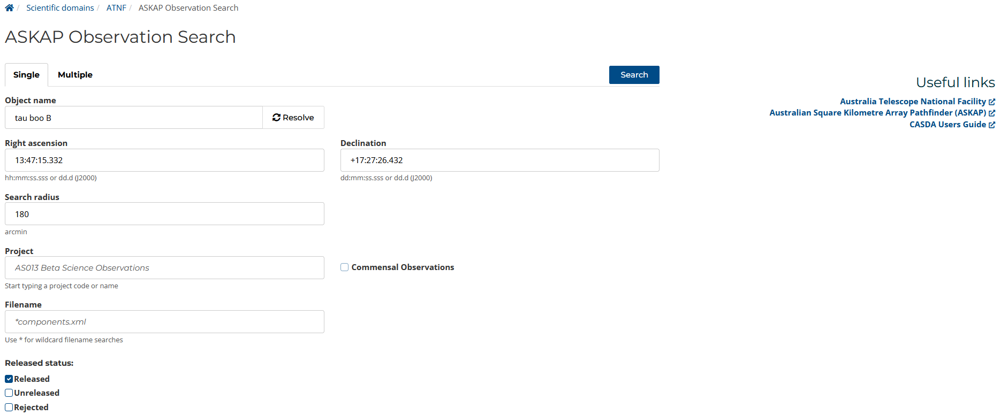

[Source](https://data.csiro.au/domain/casdaObservation?dataProducts=%5B%7B%22dataProduct%22%3A%22CATALOGUE%22%7D,%7B%22dataProduct%22%3A%22IMAGE_CUBE%22%7D,%7B%22dataProduct%22%3A%22IMAGE_CUBE_ANCILLARY%22%7D,%7B%22dataProduct%22%3A%22SPECTRUM%22%7D,%7B%22dataProduct%22%3A%22MEASUREMENT_SET%22%7D%5D&facets=%5B%5D&showRejected=false&releasedFilter=released&includeCommensalProjects=false&showFacets=true&atcaArray=%5B%5D&searchType=ASKAP&coneSearches=%5B%7B%22rightAscension%22%3A%2213%3A47%3A15.332%22,%22declination%22%3A%22%2B17%3A27%3A26.432%22,%22radius%22%3A%22180%22%7D%5D&telescopes=%5B%22ASKAP%22%5D&objectName=tau%20boo%20B)

The results of this search is shown below:

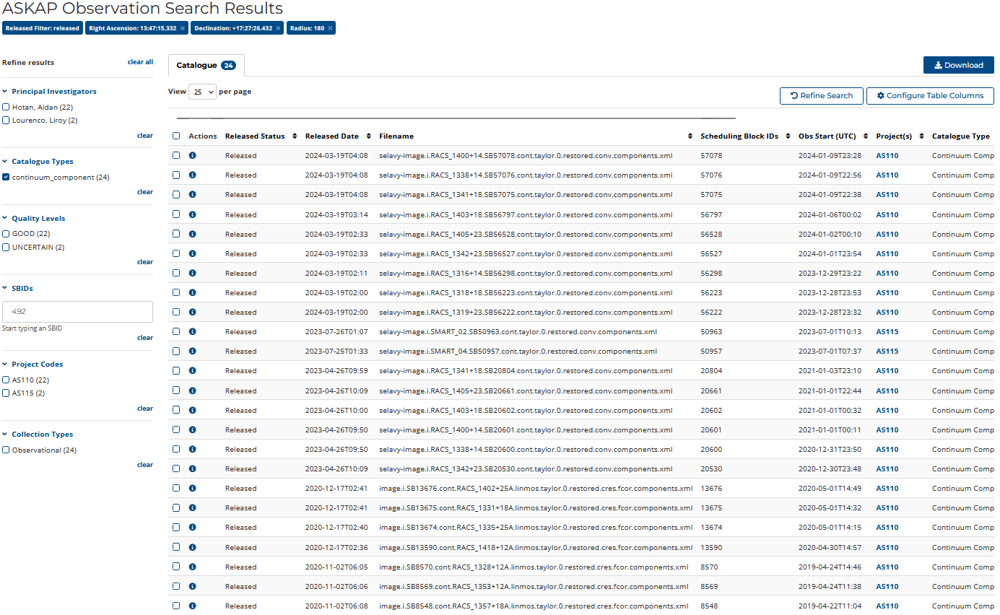

[Source](https://data.csiro.au/domain/casdaObservation/results?dataProducts=%5B%7B%22dataProduct%22%3A%22CATALOGUE%22,%22page%22%3A1,%22pageSize%22%3A25%7D,%7B%22dataProduct%22%3A%22IMAGE_CUBE%22%7D,%7B%22dataProduct%22%3A%22IMAGE_CUBE_ANCILLARY%22%7D,%7B%22dataProduct%22%3A%22SPECTRUM%22%7D,%7B%22dataProduct%22%3A%22MEASUREMENT_SET%22%7D%5D&facets=%5B%7B%22label%22%3A%22Catalogue%20Types%22,%22values%22%3A%5B%22continuum_component%22%5D%7D%5D&showRejected=false&releasedFilter=released&includeCommensalProjects=false&showFacets=true&atcaArray=%5B%5D&searchType=ASKAP&coneSearches=%5B%7B%22rightAscension%22%3A%2213%3A47%3A15.332%22,%22declination%22%3A%22%2B17%3A27%3A26.432%22,%22radius%22%3A%22180%22%7D%5D&telescopes=%5B%22ASKAP%22%5D&objectName=tau%20boo%20B)

With the following filenames:

01. selavy-image.i.RACS_1400+14.SB57078.cont.taylor.0.restored.conv.components.xml 
02. selavy-image.i.RACS_1338+14.SB57076.cont.taylor.0.restored.conv.components.xml 
03. selavy-image.i.RACS_1403+18.SB56797.cont.taylor.0.restored.conv.components.xml 
04. selavy-image.i.RACS_1405+23.SB56528.cont.taylor.0.restored.conv.components.xml 
05. selavy-image.i.RACS_1342+23.SB56527.cont.taylor.0.restored.conv.components.xml 
06. selavy-image.i.RACS_1316+14.SB56298.cont.taylor.0.restored.conv.components.xml 
07. selavy-image.i.RACS_1318+18.SB56223.cont.taylor.0.restored.conv.components.xml 
08. selavy-image.i.RACS_1319+23.SB56222.cont.taylor.0.restored.conv.components.xml 
09. selavy-image.i.SMART_02.SB50963.cont.taylor.0.restored.conv.components.xml 
10. selavy-image.i.SMART_04.SB50957.cont.taylor.0.restored.conv.components.xml 
11. selavy-image.i.RACS_1341+18.SB20804.cont.taylor.0.restored.conv.components.xml 
12. selavy-image.i.RACS_1405+23.SB20661.cont.taylor.0.restored.conv.components.xml 
13. selavy-image.i.RACS_1403+18.SB20602.cont.taylor.0.restored.conv.components.xml 
14. selavy-image.i.RACS_1400+14.SB20601.cont.taylor.0.restored.conv.components.xml 
15. selavy-image.i.RACS_1338+14.SB20600.cont.taylor.0.restored.conv.components.xml 
16. selavy-image.i.RACS_1342+23.SB20530.cont.taylor.0.restored.conv.components.xml 
17. image.i.SB13676.cont.RACS_1402+25A.linmos.taylor.0.restored.cres.fcor.components.xml 
18. image.i.SB13675.cont.RACS_1331+18A.linmos.taylor.0.restored.cres.fcor.components.xml 
19. image.i.SB13674.cont.RACS_1335+25A.linmos.taylor.0.restored.cres.fcor.components.xml 
20. image.i.SB13590.cont.RACS_1418+12A.linmos.taylor.0.restored.cres.fcor.components.xml 
21. image.i.SB8570.cont.RACS_1328+12A.linmos.taylor.0.restored.cres.fcor.components.xml 
22. image.i.SB8569.cont.RACS_1353+12A.linmos.taylor.0.restored.cres.fcor.components.xml 
23. image.i.SB8548.cont.RACS_1357+18A.linmos.taylor.0.restored.cres.fcor.components.xml 

The two code blocks below are setup:

In [12]:
import numpy as np
import pandas as pd
import os, re

from datetime import datetime

from astropy.table import Table
from astroquery.casda import Casda
from astroquery.utils.tap.core import TapPlus
from astroquery.utils.tap.core import Tap

import astropy.units as un
import astropy.coordinates as coord

from astropy.io.votable import parse, parse_single_table
from astropy.coordinates import SkyCoord

debug = True
# colored text
TYELLOW = "\033[1;33m"
TRESET = "\033[m"

The parameters for the search are:

In [13]:
taubb = (14.495263, -62.67949)
TARGET_SOURCE_COORDS    = SkyCoord(ra = taubb[0] * un.deg, dec = taubb[1] * un.deg)
CATALOGUE_SEARCH_RADIUS = 3 * un.deg # based on CASDA uncertainty
SEARCH_RADIUS = 3 * un.arcsecond

# pubdat
First we examine `pubdat`, the result of filtering through the initial raw catalogue files retrieved from CASDA:
```python
# Set up the TAP url
tap = TapPlus(url="https://casda.csiro.au/casda_vo_tools/tap")

# Search for continuum catalogues
job = tap.launch_job_async((f"SELECT TOP {CATALOGUE_COUNT} * FROM ivoa.obscore where(dataproduct_subtype = 'catalogue.continuum.component')")) 
r = job.get_results()

# Keep only good or uncertain data
data = r[(r['quality_level'] == 'GOOD') | (r['quality_level'] == 'UNCERTAIN')]

# You have to do this step unless you have permission for embargoed data 
# associated with you OPAL account login
public_data_df = Casda.filter_out_unreleased(data).to_pandas() # astropy table
```
These 3 functions below are helper functions for `get_public_data_table`

In [14]:
def delete_directory_contents(directory_path) -> None:
    for filename in os.listdir(directory_path):
        filepath = os.path.join(directory_path, filename)
        try:
            if os.path.isfile(filepath):
                os.unlink(filepath)
            elif os.path.isdir(filepath):
                os.rmdir(filepath)
        except Exception as e:
            print(f"Failed to delete {filepath} from cache. Reason: {e}")

def check_casda_cache() -> bool:
    '''
    Checks if pubdat cache (casda_cache/pubdat-YYYY-MM-DD.csv) already exists        
    '''
    # match pubdat-YYYY-MM-DD.csv
    pattern = r"pubdat-\d{4}-\d{2}-\d{2}\.csv"

    # absolute path to casda cache folder ("Final_crossmatcher/casda_cache")
    directory = os.path.join("./", "casda_cache/")

    if not os.path.exists(directory):
        return False
    
    # List all files in the directory
    files = os.listdir(directory)

    # Filter files matching the pattern
    for file in files:
        if re.match(pattern, file):
            return True
    return False

def get_public_data_table(refresh=False) -> Table:
    '''
    Retrieve top CATALOGUE_COUNT of continuum catalogues from CASDA
        
    Args:
        refresh (bool): search radius in ARCSECONDS 

    Returns:
        Top CATALOGUE_COUNT continuum catalogues as a pandas dataframe
    '''
    CATALOGUE_COUNT = 50000 # 50000 default
    CACHE_FOLDER = os.path.join("./", "casda_cache/")

    # check cache
    if check_casda_cache() and not refresh:
        cache_filenames = os.listdir(CACHE_FOLDER)
        cache_path = CACHE_FOLDER + cache_filenames[0]
        return pd.read_csv(cache_path)

    # clear cache
    delete_directory_contents(CACHE_FOLDER)

    # Set up the TAP url
    tap = TapPlus(url="https://casda.csiro.au/casda_vo_tools/tap")

    # Search for continuum catalogues
    job = tap.launch_job_async((f"SELECT TOP {CATALOGUE_COUNT} * FROM ivoa.obscore where(dataproduct_subtype = 'catalogue.continuum.component')")) 
    r = job.get_results()

    # Keep only good or uncertain data
    data = r[(r['quality_level'] == 'GOOD') | (r['quality_level'] == 'UNCERTAIN')]

    # You have to do this step unless you have permission for embargoed data 
    # associated with you OPAL account login
    public_data_df = Casda.filter_out_unreleased(data).to_pandas() # astropy table

    # save pubdata as cache
    cache_filename = "pubdat-" + datetime.now().strftime("%Y-%m-%d")
    cache_path = CACHE_FOLDER + cache_filename + ".csv"
    cache_filenames_path = CACHE_FOLDER + cache_filename + ".txt"
    public_data_df.to_csv(cache_path, index=False)
    public_data_df['filename'].to_csv(cache_filenames_path)
    
    return public_data_df

This step does the initial retrieval and filtering of files. Notice how `pubdat` has length: 9969 while `reduced_pubdat` has length: 8050 even though the both row indices still end at 9969. This is because rows in the middle are stripped while non-stripped rows are still in order.  

In [15]:
"""
Snippet from casda_search.py
"""
# get CASDA continuum catalogues
# A choice was made here to only consider .cont.taylor.0.restored.conv.components.xml files to restrict data
refresh=False
if debug:
    print(TYELLOW + "-- Beginning pubdat retrieval" + TRESET)

pattern = r'.*.cont.taylor.0.restored.conv.components.xml$'
pubdat = get_public_data_table(refresh=refresh)
reduced_pubdat = pubdat[pubdat['filename'].str.contains(pattern, regex=True)]

if debug:
    print(TYELLOW + "-- pubdat files retrieved:" + TRESET)
    i = 1
    for filename in pubdat['filename']:
        print(f"({i:02d}): "+filename)
        i += 1

-- Beginning pubdat retrieval
-- pubdat files retrieved:
(01): selavy-image.i.RACS_2221+14.SB29572.cont.taylor.0.restored.conv.components.xml
(02): selavy-image.i.RACS_1041-18.SB21847.cont.taylor.0.restored.conv.components.xml
(03): selavy-image.i.RACS_1348+28.SB20477.cont.taylor.0.restored.conv.components.xml
(04): selavy-image.i.RACS_1608+37.SB20536.cont.taylor.0.restored.conv.components.xml
(05): selavy-image.i.RACS_1902-23.SB21440.cont.taylor.0.restored.conv.components.xml
(06): selavy-image.i.RACS_1733+04.SB21931.cont.taylor.0.restored.conv.components.xml
(07): selavy-image.i.RACS_0230+00.SB20469.cont.taylor.0.restored.conv.components.xml
(08): selavy-image.i.RACS_1527+41.SB20480.cont.taylor.0.restored.conv.components.xml
(09): selavy-image.i.RACS_0439+09.SB21396.cont.taylor.0.restored.conv.components.xml
(10): selavy-image.i.RACS_2003-09.SB20449.cont.taylor.0.restored.conv.components.xml
(11): selavy-image.i.RACS_1400+14.SB20601.cont.taylor.0.restored.conv.components.xml
(12): se

In [16]:
if debug:      
    print(TYELLOW + "-- reduced pubdat files retrieved:" + TRESET)
    i = 1
    for filename in reduced_pubdat['filename']:
        print(f"({i:02d}): "+filename)
        i += 1

-- reduced pubdat files retrieved:
(01): selavy-image.i.RACS_2221+14.SB29572.cont.taylor.0.restored.conv.components.xml
(02): selavy-image.i.RACS_1041-18.SB21847.cont.taylor.0.restored.conv.components.xml
(03): selavy-image.i.RACS_1348+28.SB20477.cont.taylor.0.restored.conv.components.xml
(04): selavy-image.i.RACS_1608+37.SB20536.cont.taylor.0.restored.conv.components.xml
(05): selavy-image.i.RACS_1902-23.SB21440.cont.taylor.0.restored.conv.components.xml
(06): selavy-image.i.RACS_1733+04.SB21931.cont.taylor.0.restored.conv.components.xml
(07): selavy-image.i.RACS_0230+00.SB20469.cont.taylor.0.restored.conv.components.xml
(08): selavy-image.i.RACS_1527+41.SB20480.cont.taylor.0.restored.conv.components.xml
(09): selavy-image.i.RACS_0439+09.SB21396.cont.taylor.0.restored.conv.components.xml
(10): selavy-image.i.RACS_2003-09.SB20449.cont.taylor.0.restored.conv.components.xml
(11): selavy-image.i.RACS_1400+14.SB20601.cont.taylor.0.restored.conv.components.xml
(12): selavy-image.i.RACS_1549

The filenames of each file retrieved by pubdat can be found in `./casda_cache/*.txt`.

In [17]:
# reading contents ./casda_cache/*.txt
for filepath in os.listdir("./casda_cache"):
    if ".txt" in filepath:
        filepath = "./casda_cache/" + filepath
        with open(filepath, 'r') as f:
            filenames = f.read()

cache_filename_list = [line.split(',', 1)[1] for line in [line.strip() for line in filenames.split('\n') if line.strip()][1:]]

print("pubdat files retrieved: ", len(cache_filename_list))
i = 1
for filename in cache_filename_list:
    print(f"({i:02d}): "+filename)
    i += 1


pubdat files retrieved:  9969
(01): selavy-image.i.RACS_2221+14.SB29572.cont.taylor.0.restored.conv.components.xml
(02): selavy-image.i.RACS_1041-18.SB21847.cont.taylor.0.restored.conv.components.xml
(03): selavy-image.i.RACS_1348+28.SB20477.cont.taylor.0.restored.conv.components.xml
(04): selavy-image.i.RACS_1608+37.SB20536.cont.taylor.0.restored.conv.components.xml
(05): selavy-image.i.RACS_1902-23.SB21440.cont.taylor.0.restored.conv.components.xml
(06): selavy-image.i.RACS_1733+04.SB21931.cont.taylor.0.restored.conv.components.xml
(07): selavy-image.i.RACS_0230+00.SB20469.cont.taylor.0.restored.conv.components.xml
(08): selavy-image.i.RACS_1527+41.SB20480.cont.taylor.0.restored.conv.components.xml
(09): selavy-image.i.RACS_0439+09.SB21396.cont.taylor.0.restored.conv.components.xml
(10): selavy-image.i.RACS_2003-09.SB20449.cont.taylor.0.restored.conv.components.xml
(11): selavy-image.i.RACS_1400+14.SB20601.cont.taylor.0.restored.conv.components.xml
(12): selavy-image.i.RACS_1549+14.S

The files retrieved from the casda website are:

In [18]:
text = """
01. selavy-image.i.RACS_1400+14.SB57078.cont.taylor.0.restored.conv.components.xml 
02. selavy-image.i.RACS_1338+14.SB57076.cont.taylor.0.restored.conv.components.xml 
03. selavy-image.i.RACS_1403+18.SB56797.cont.taylor.0.restored.conv.components.xml 
04. selavy-image.i.RACS_1405+23.SB56528.cont.taylor.0.restored.conv.components.xml 
05. selavy-image.i.RACS_1342+23.SB56527.cont.taylor.0.restored.conv.components.xml 
06. selavy-image.i.RACS_1316+14.SB56298.cont.taylor.0.restored.conv.components.xml 
07. selavy-image.i.RACS_1318+18.SB56223.cont.taylor.0.restored.conv.components.xml 
08. selavy-image.i.RACS_1319+23.SB56222.cont.taylor.0.restored.conv.components.xml 
09. selavy-image.i.SMART_02.SB50963.cont.taylor.0.restored.conv.components.xml 
10. selavy-image.i.SMART_04.SB50957.cont.taylor.0.restored.conv.components.xml 
11. selavy-image.i.RACS_1341+18.SB20804.cont.taylor.0.restored.conv.components.xml 
12. selavy-image.i.RACS_1405+23.SB20661.cont.taylor.0.restored.conv.components.xml 
13. selavy-image.i.RACS_1403+18.SB20602.cont.taylor.0.restored.conv.components.xml 
14. selavy-image.i.RACS_1400+14.SB20601.cont.taylor.0.restored.conv.components.xml 
15. selavy-image.i.RACS_1338+14.SB20600.cont.taylor.0.restored.conv.components.xml 
16. selavy-image.i.RACS_1342+23.SB20530.cont.taylor.0.restored.conv.components.xml 
17. image.i.SB13676.cont.RACS_1402+25A.linmos.taylor.0.restored.cres.fcor.components.xml 
18. image.i.SB13675.cont.RACS_1331+18A.linmos.taylor.0.restored.cres.fcor.components.xml 
19. image.i.SB13674.cont.RACS_1335+25A.linmos.taylor.0.restored.cres.fcor.components.xml 
20. image.i.SB13590.cont.RACS_1418+12A.linmos.taylor.0.restored.cres.fcor.components.xml 
21. image.i.SB8570.cont.RACS_1328+12A.linmos.taylor.0.restored.cres.fcor.components.xml 
22. image.i.SB8569.cont.RACS_1353+12A.linmos.taylor.0.restored.cres.fcor.components.xml 
23. image.i.SB8548.cont.RACS_1357+18A.linmos.taylor.0.restored.cres.fcor.components.xml 
"""
casda_filename_list = [line.split('. ')[1] for line in [line.strip() for line in text.split('\n') if line.strip()]]
casda_filename_list.sort()
print("casda website files retrieved: ", len(casda_filename_list))
i = 1
for filename in casda_filename_list:
    print(f"({i:02d}): "+filename)
    i += 1

casda website files retrieved:  23
(01): image.i.SB13590.cont.RACS_1418+12A.linmos.taylor.0.restored.cres.fcor.components.xml
(02): image.i.SB13674.cont.RACS_1335+25A.linmos.taylor.0.restored.cres.fcor.components.xml
(03): image.i.SB13675.cont.RACS_1331+18A.linmos.taylor.0.restored.cres.fcor.components.xml
(04): image.i.SB13676.cont.RACS_1402+25A.linmos.taylor.0.restored.cres.fcor.components.xml
(05): image.i.SB8548.cont.RACS_1357+18A.linmos.taylor.0.restored.cres.fcor.components.xml
(06): image.i.SB8569.cont.RACS_1353+12A.linmos.taylor.0.restored.cres.fcor.components.xml
(07): image.i.SB8570.cont.RACS_1328+12A.linmos.taylor.0.restored.cres.fcor.components.xml
(08): selavy-image.i.RACS_1316+14.SB56298.cont.taylor.0.restored.conv.components.xml
(09): selavy-image.i.RACS_1318+18.SB56223.cont.taylor.0.restored.conv.components.xml
(10): selavy-image.i.RACS_1319+23.SB56222.cont.taylor.0.restored.conv.components.xml
(11): selavy-image.i.RACS_1338+14.SB20600.cont.taylor.0.restored.conv.compon

These are the files in common between the casda cache and the casda website search: 

In [19]:
in_common = [filename for filename in cache_filename_list if filename in casda_filename_list]
in_common.sort()
print("files in common:", len(in_common))
i = 1
for filename in in_common:
    print(f"({i:02d}): "+filename)
    i += 1

files in common: 23
(01): image.i.SB13590.cont.RACS_1418+12A.linmos.taylor.0.restored.cres.fcor.components.xml
(02): image.i.SB13674.cont.RACS_1335+25A.linmos.taylor.0.restored.cres.fcor.components.xml
(03): image.i.SB13675.cont.RACS_1331+18A.linmos.taylor.0.restored.cres.fcor.components.xml
(04): image.i.SB13676.cont.RACS_1402+25A.linmos.taylor.0.restored.cres.fcor.components.xml
(05): image.i.SB8548.cont.RACS_1357+18A.linmos.taylor.0.restored.cres.fcor.components.xml
(06): image.i.SB8569.cont.RACS_1353+12A.linmos.taylor.0.restored.cres.fcor.components.xml
(07): image.i.SB8570.cont.RACS_1328+12A.linmos.taylor.0.restored.cres.fcor.components.xml
(08): selavy-image.i.RACS_1316+14.SB56298.cont.taylor.0.restored.conv.components.xml
(09): selavy-image.i.RACS_1318+18.SB56223.cont.taylor.0.restored.conv.components.xml
(10): selavy-image.i.RACS_1319+23.SB56222.cont.taylor.0.restored.conv.components.xml
(11): selavy-image.i.RACS_1338+14.SB20600.cont.taylor.0.restored.conv.components.xml
(12): 

In [20]:
pubdat_csv = pd.read_csv("./casda_cache/pubdat-2024-05-06.csv")
filtered_pubdat = pubdat_csv[pubdat_csv['filename'].isin(in_common)]

So all expected files from pubdat are retrieved and until this point, `casda.py` works as expected for our tau boo b test data.

# Filtering pubdat catalogue files for our target source 

After this step, the `matching_files` list should be exactly what is output at the final cell of the pubdat section above. The `reduced_pubdat` dataframe gets successfully converted to a SkyCoord object in degrees.

Recall that the target source has the following coordinates with the search radius for catalogue search being:

In [21]:
print(type(TARGET_SOURCE_COORDS), TARGET_SOURCE_COORDS)
print(type(CATALOGUE_SEARCH_RADIUS), CATALOGUE_SEARCH_RADIUS)

<class 'astropy.coordinates.sky_coordinate.SkyCoord'> <SkyCoord (ICRS): (ra, dec) in deg
    (14.495263, -62.67949)>
<class 'astropy.units.quantity.Quantity'> 3.0 deg


Filtering process begins below. Here all `reduced_pubdat` center coordinates are compiled as a `SkyCoord` object, sorted for convenience of this notebook.

In [22]:
# Get the centre coordsof all of the continuum catalogues in the table
center_coords = SkyCoord(np.array(reduced_pubdat['s_ra'])*un.deg, 
                            np.array(reduced_pubdat['s_dec'])*un.deg)

# for display
print("number of catalogues: ", len(center_coords))
print("ra sorted center coordinates:")
sorted_center_coords_ra = center_coords[center_coords.ra.argsort()]

for i in range(len(sorted_center_coords_ra)):
    print(f"({i:02d}): ", sorted_center_coords_ra[i])

number of catalogues:  8050
ra sorted center coordinates:
(00):  <SkyCoord (ICRS): (ra, dec) in deg
    (5.280206, 9.2812715)>
(01):  <SkyCoord (ICRS): (ra, dec) in deg
    (5.2824995, -9.4070735)>
(02):  <SkyCoord (ICRS): (ra, dec) in deg
    (5.292368, 4.6132395)>
(03):  <SkyCoord (ICRS): (ra, dec) in deg
    (5.302569, 0.027702)>
(04):  <SkyCoord (ICRS): (ra, dec) in deg
    (5.314539, -0.0338635)>
(05):  <SkyCoord (ICRS): (ra, dec) in deg
    (5.319257, -9.298915)>
(06):  <SkyCoord (ICRS): (ra, dec) in deg
    (5.3527595, -4.6682365)>
(07):  <SkyCoord (ICRS): (ra, dec) in deg
    (5.3688905, -4.668875)>
(08):  <SkyCoord (ICRS): (ra, dec) in deg
    (5.384508, -9.3881165)>
(09):  <SkyCoord (ICRS): (ra, dec) in deg
    (5.406863, 4.6273815)>
(10):  <SkyCoord (ICRS): (ra, dec) in deg
    (5.421556, -4.7483475)>
(11):  <SkyCoord (ICRS): (ra, dec) in deg
    (5.4369235, 9.280745)>
(12):  <SkyCoord (ICRS): (ra, dec) in deg
    (5.4409935, 0.0329785)>
(13):  <SkyCoord (ICRS): (ra, dec) in

We find the separation between each center coordinate and target source coordinates.

In [23]:
# find which files in pubdat have center coordinates within catalogue_search_radius of source
seps = TARGET_SOURCE_COORDS.separation(center_coords).to('arcsecond') 

# for display
print("target: ", TARGET_SOURCE_COORDS)
print(type(seps), "seps:", seps)

sorted_indices = seps.argsort()
print("seps in degrees:")
for i in range(len(seps)):
    index = sorted_indices[i]
    sep = seps[index]
    center_coord = center_coords[index]
    print(f"({i + 1:02d}): Separation (deg): {sep.degree}, from: {center_coord}")

target:  <SkyCoord (ICRS): (ra, dec) in deg
    (14.495263, -62.67949)>
<class 'astropy.coordinates.angles.core.Angle'> seps: [297017 arcsec 339368 arcsec 519368 arcsec ... 234650 arcsec 269206 arcsec
 370649 arcsec]
seps in degrees:
(01): Separation (deg): 1.0235667868280427, from: <SkyCoord (ICRS): (ra, dec) in deg
    (12.3310825, -62.4482805)>
(02): Separation (deg): 2.528732653553885, from: <SkyCoord (ICRS): (ra, dec) in deg
    (11.7189515, -64.8915475)>
(03): Separation (deg): 2.576849493674601, from: <SkyCoord (ICRS): (ra, dec) in deg
    (11.459525, -64.880514)>
(04): Separation (deg): 3.052313364485589, from: <SkyCoord (ICRS): (ra, dec) in deg
    (8.4458155, -64.087065)>
(05): Separation (deg): 3.0610715017663837, from: <SkyCoord (ICRS): (ra, dec) in deg
    (10.307342, -60.3580175)>
(06): Separation (deg): 3.134085680256724, from: <SkyCoord (ICRS): (ra, dec) in deg
    (10.161272, -60.3226965)>
(07): Separation (deg): 3.136319320105574, from: <SkyCoord (ICRS): (ra, dec) in 

## Results of pubdat filter
Select items in `seps` that are within our search radius.

In [24]:
# find which files in pubdat have center coordinates within catalogue_search_radius of source
matches = np.where(seps < CATALOGUE_SEARCH_RADIUS.to('arcsecond') )[0]

# for display
print("matches indices:", matches)
for i in matches:
    # Access separation, center coordinate, and matching filename
    sep_deg = seps[i].degree
    center_coord = center_coords[i]
    filename = reduced_pubdat.iloc[i]['filename']
    
    # Print information
    print(f"({i:02d}): sep (deg): {sep_deg}, from catalogue with center coords: {center_coord}")
    print(f"Matching filename: {filename}")


matches indices: [ 849 4603 7561]
(849): sep (deg): 2.528732653553885, from catalogue with center coords: <SkyCoord (ICRS): (ra, dec) in deg
    (11.7189515, -64.8915475)>
Matching filename: selavy-image.i.RACS_0046-64.SB21200.cont.taylor.0.restored.conv.components.xml
(4603): sep (deg): 1.0235667868280427, from catalogue with center coords: <SkyCoord (ICRS): (ra, dec) in deg
    (12.3310825, -62.4482805)>
Matching filename: selavy-image.i.FLASH_060.SB52536.cont.taylor.0.restored.conv.components.xml
(7561): sep (deg): 2.576849493674601, from catalogue with center coords: <SkyCoord (ICRS): (ra, dec) in deg
    (11.459525, -64.880514)>
Matching filename: selavy-image.i.RACS_0046-64.SB57107.cont.taylor.0.restored.conv.components.xml



Finally, get the list of related filenames of each corresponding `seps` items that survive the search radius filtering.

In [25]:
matching_files = np.array(reduced_pubdat.iloc[matches]['filename'])

# for display
print("matching files:", len(matching_files))
for i in range(len(matching_files)):
    print(f"({i:02d}): "+matching_files[i])

matching files: 3
(00): selavy-image.i.RACS_0046-64.SB21200.cont.taylor.0.restored.conv.components.xml
(01): selavy-image.i.FLASH_060.SB52536.cont.taylor.0.restored.conv.components.xml
(02): selavy-image.i.RACS_0046-64.SB57107.cont.taylor.0.restored.conv.components.xml


This code appears to be working correctly for the given pubdat data but seems to disagree with results from the CASDA website search.

# XML Download
This part is quite straightforward and works as intended. Downloading the related xml files for each matching file above

In [26]:
# Your OPAL username for login
casda = None
if casda == None:
    username = input('Enter your CASDA username (email): ')
    casda = Casda()
    casda.login(username=username)

INFO: Authenticating brian.w.tjahjadi@gmail.com on CASDA ... [astroquery.casda.core]
INFO: Authentication successful! [astroquery.casda.core]


In [27]:
CASDA_XML_DOWNLOAD_PATH = os.path.join("./", "casda_catalogue_xml_downloads/")

# This part stages the files you want to download so it sometimes takes a minute
url_list = []
for mfile in matching_files:
    pdata = reduced_pubdat[reduced_pubdat['filename'] == mfile]
    ptable = Table.from_pandas(pdata)
    urls = casda.stage_data(ptable, verbose=debug)
    for url in urls:
        if url not in url_list:
            url_list.append(url)

# filter through checksum files
url_list = list(filter(lambda url: 'checksum' not in url, url_list))

if debug:
    print(TYELLOW + "-- url_list:" + TRESET + "\n", url_list)

# ensure xml download directory exists
if not os.path.exists(CASDA_XML_DOWNLOAD_PATH):
    os.makedirs(CASDA_XML_DOWNLOAD_PATH)

# file download
xml_filelist = casda.download_files(url_list, savedir=CASDA_XML_DOWNLOAD_PATH)

INFO: Created data staging job https://casda.csiro.au/casda_data_access/data/async/b1647751-ad84-45e6-85c4-b428ff4f467a [astroquery.casda.core]
INFO: Starting the retrieval job... [astroquery.casda.core]
INFO: Job is EXECUTING, polling every 20 seconds. [astroquery.casda.core]
INFO: Created data staging job https://casda.csiro.au/casda_data_access/data/async/a869f155-7d86-4611-953b-19aa5a9e3131 [astroquery.casda.core]
INFO: Starting the retrieval job... [astroquery.casda.core]
INFO: Created data staging job https://casda.csiro.au/casda_data_access/data/async/ad98bf52-dc42-404d-9809-17427d87e2bf [astroquery.casda.core]
INFO: Starting the retrieval job... [astroquery.casda.core]
-- url_list:
 ['https://ingest.pawsey.org.au/casda-prd-as110-01/sb21200/catalogues/selavy-image.i.RACS_0046-64.SB21200.cont.taylor.0.restored.conv.components.xml?response-content-disposition=attachment%3B%20filename%20%3D%22selavy-image.i.RACS_0046-64.SB21200.cont.taylor.0.restored.conv.components.xml%22&X-Amz-Al

# XML to Pandas
Converting downloaded XML files to pandas dataframes.

In [28]:
def convert_xml_to_pandas(xml_file_name):
    votable = parse(xml_file_name)
    table = votable.get_first_table()
    bill = table.to_table(use_names_over_ids=True)
    return bill.to_pandas()

In [29]:
'''
Searching for planet through xml dataset
'''
catalogue_dfs = pd.DataFrame()
for xml_file in xml_filelist:
    catalogue_df = convert_xml_to_pandas(xml_file)
    catalogue_dfs = pd.concat([catalogue_dfs, catalogue_df], ignore_index=True)

    print("catalogue_df length:", len(catalogue_df), "catalogue_dfs length:", len(catalogue_dfs))

catalogue_df length: 3341 catalogue_dfs length: 3341
catalogue_df length: 16283 catalogue_dfs length: 19624
catalogue_df length: 5436 catalogue_dfs length: 25060


In [30]:
CASDA_CSV_DOWNLOAD_PATH = os.path.join("./", "casda_catalogue_csv_downloads/")

# ensure csv download directory exists
if not os.path.exists(CASDA_CSV_DOWNLOAD_PATH):
    os.makedirs(CASDA_CSV_DOWNLOAD_PATH)

catalogue_dfs = catalogue_dfs.sort_values(by=['ra_deg_cont', 'dec_deg_cont'])
catalogue_dfs.to_csv(CASDA_CSV_DOWNLOAD_PATH+f"sra{taubb[0]}"+f"sdec{taubb[1]}.csv")

# display
catalogue_dfs

,island_id,component_id,component_name,ra_hms_cont,dec_dms_cont,ra_deg_cont,dec_deg_cont,ra_err,dec_err,freq,...,spectral_index,spectral_curvature,spectral_index_err,spectral_curvature_err,rms_image,has_siblings,fit_is_estimate,spectral_index_from_TT,flag_c4,comment
20326,SB57107_island_502,SB57107_component_502a,J000743-665546,00:07:43.5,-66:55:46,1.931060,-66.929658,0.17,0.23,943.5,...,-99.00,-99.0,0.0,0.0,0.728,1,0,1,0,
20327,SB57107_island_502,SB57107_component_502b,J000744-665608,00:07:44.4,-66:56:08,1.935038,-66.935630,0.60,0.67,943.5,...,-99.00,-99.0,0.0,0.0,0.728,1,0,1,0,
20523,SB57107_island_658,SB57107_component_658a,J000809-670755,00:08:09.5,-67:07:55,2.039502,-67.132166,0.31,0.40,943.5,...,-99.00,-99.0,0.0,0.0,0.790,0,0,1,0,
21498,SB57107_island_1510,SB57107_component_1510a,J000821-670243,00:08:21.5,-67:02:43,2.089521,-67.045502,0.39,0.45,943.5,...,-99.00,-99.0,0.0,0.0,0.718,0,0,1,0,
20520,SB57107_island_656,SB57107_component_656b,J000829-671627,00:08:29.2,-67:16:27,2.121481,-67.274417,0.20,0.20,943.5,...,-99.00,-99.0,0.0,0.0,0.799,1,0,1,0,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7752,SB52536_island_3065,SB52536_component_3065a,J012412-644940,01:24:12.3,-64:49:40,21.051207,-64.827822,0.47,0.59,855.5,...,-99.00,-99.0,0.0,0.0,0.304,0,0,1,0,
5911,SB52536_island_1510,SB52536_component_1510a,J012421-644747,01:24:21.4,-64:47:47,21.089301,-64.796570,0.14,0.13,855.5,...,-99.00,-99.0,0.0,0.0,0.154,0,0,1,0,
7603,SB52536_island_2935,SB52536_component_2935a,J012422-645600,01:24:22.3,-64:56:00,21.092817,-64.933470,0.07,0.06,855.5,...,0.27,-99.0,0.0,0.0,0.030,0,0,1,0,
9092,SB52536_island_4226,SB52536_component_4226a,J012435-642711,01:24:35.2,-64:27:11,21.146672,-64.453144,0.61,0.69,855.5,...,-99.00,-99.0,0.0,0.0,0.267,0,0,1,0,


# Filtering for target in matching catalogues
Same as "Filtering pubdat catalogue files for our target source"

In [31]:
# Get the centre coordsof all of the continuum catalogues in the table
catalogue_coords = SkyCoord(ra = np.array(catalogue_dfs['ra_deg_cont']) * un.deg,
                            dec = np.array(catalogue_dfs['dec_deg_cont']) * un.deg)

# for display
print("number of sources: ", len(catalogue_coords))
print("ra sorted source coordinates:")
sorted_catalogue_coords_ra = catalogue_coords[catalogue_coords.ra.argsort()]

for i in range(len(sorted_catalogue_coords_ra)):
    print(f"({i:02d}): ", sorted_catalogue_coords_ra[i])

number of sources:  25060
ra sorted source coordinates:
(00):  <SkyCoord (ICRS): (ra, dec) in deg
    (1.93106, -66.929658)>
(01):  <SkyCoord (ICRS): (ra, dec) in deg
    (1.935038, -66.93563)>
(02):  <SkyCoord (ICRS): (ra, dec) in deg
    (2.039502, -67.132166)>
(03):  <SkyCoord (ICRS): (ra, dec) in deg
    (2.089521, -67.045502)>
(04):  <SkyCoord (ICRS): (ra, dec) in deg
    (2.121481, -67.274417)>
(05):  <SkyCoord (ICRS): (ra, dec) in deg
    (2.122376, -67.066087)>
(06):  <SkyCoord (ICRS): (ra, dec) in deg
    (2.12417, -67.288401)>
(07):  <SkyCoord (ICRS): (ra, dec) in deg
    (2.131529, -67.064814)>
(08):  <SkyCoord (ICRS): (ra, dec) in deg
    (2.200581, -66.290008)>
(09):  <SkyCoord (ICRS): (ra, dec) in deg
    (2.204385, -65.358235)>
(10):  <SkyCoord (ICRS): (ra, dec) in deg
    (2.204851, -66.294338)>
(11):  <SkyCoord (ICRS): (ra, dec) in deg
    (2.291545, -66.630668)>
(12):  <SkyCoord (ICRS): (ra, dec) in deg
    (2.301484, -66.463039)>
(13):  <SkyCoord (ICRS): (ra, dec) in

## Result of target filter
Select items in `seps` that are within our search radius.

In [32]:
seps = TARGET_SOURCE_COORDS.separation(catalogue_coords).to('arcsecond') 

# for display
print("target: ", TARGET_SOURCE_COORDS)
print(type(seps), "seps:", seps)

sorted_indices = seps.argsort()
print("seps in degrees:")
for i in range(len(seps)):
    index = sorted_indices[i]
    sep = seps[index]
    catalogue_coord = catalogue_coords[index]
    print(f"({i + 1:02d}): Separation (arcsecs): {sep.arcsecond}, from: {catalogue_coord}")

target:  <SkyCoord (ICRS): (ra, dec) in deg
    (14.495263, -62.67949)>
<class 'astropy.coordinates.angles.core.Angle'> seps: [24519.1 arcsec 24526 arcsec 24794.6 arcsec ... 13246.4 arcsec
 12416.6 arcsec 12314.9 arcsec]
seps in degrees:
(01): Separation (arcsecs): 6.462951991201307, from: <SkyCoord (ICRS): (ra, dec) in deg
    (14.49851, -62.678489)>
(02): Separation (arcsecs): 36.554568445832544, from: <SkyCoord (ICRS): (ra, dec) in deg
    (14.48659, -62.670149)>
(03): Separation (arcsecs): 39.282445939682084, from: <SkyCoord (ICRS): (ra, dec) in deg
    (14.483561, -62.669992)>
(04): Separation (arcsecs): 162.12503161475252, from: <SkyCoord (ICRS): (ra, dec) in deg
    (14.50451, -62.634656)>
(05): Separation (arcsecs): 229.88793720333194, from: <SkyCoord (ICRS): (ra, dec) in deg
    (14.53076, -62.741239)>
(06): Separation (arcsecs): 235.8992905844902, from: <SkyCoord (ICRS): (ra, dec) in deg
    (14.633356, -62.66292)>
(07): Separation (arcsecs): 247.8321309357963, from: <SkyCoor

In [33]:
# find which files in pubdat have center coordinates within catalogue_search_radius of source
matches = np.where(seps < SEARCH_RADIUS.to('arcsecond') )[0]

# for display
print("matches indices:", matches)
for i in matches:
    # Access separation, center coordinate, and matching filename
    sep_arcsecs = seps[i].arcsecond
    catalogue_coord = catalogue_coords[i]
    
    # Print information
    print(f"({i:02d}): sep (arcsecs): {sep_arcsecs}, from source with coords: {catalogue_coord}")

matches indices: []


# CASDA_SEARCH()
For reference the `casda_search()` function from `casda.py` is attached below

In [34]:
def casda_search(source_ra: float, source_dec: float, search_radius: float =3, output_filename: str='matches',
                 casda = None, refresh=False, debug=False) -> pd.DataFrame:
    """
    Generate csv of matches of given source with CASDA continuum catalogues

    Args:
        source_ra (float): source right ascension
        source_dec (float): source declination
        search_radius (float): search radius in ARCSECONDS
        casda (Casda): casda instance
        # output_filename (str): filename of output csv [i.e. <output_filename>.csv]
        # debug (booolean) = False : print debug information
    """
    CASDA_XML_DOWNLOAD_PATH = os.path.join(os.path.dirname(__file__), "casda_catalogue_xml_downloads/")
    CASDA_CSV_DOWNLOAD_PATH = os.path.join(os.path.dirname(__file__), "casda_catalogue_csv_downloads/")
    CASDA_MATCHES_PATH      = os.path.join(os.path.dirname(__file__), "casda_matches/")
    TARGET_SOURCE_COORDS    = SkyCoord(ra = source_ra * un.deg, dec = source_dec * un.deg)
    CATALOGUE_SEARCH_RADIUS = 3 * un.deg # based on CASDA uncertainty
    SEARCH_RADIUS           = search_radius * un.arcsecond

    # colored text
    TYELLOW = "\033[1;33m"
    TRESET = "\033[m"

    '''
    CASDA login and setup
    '''
    # Your OPAL username for login
    if casda == None:
        username = input('Enter your CASDA username (email): ')
        casda = Casda()
        casda.login(username=username)

    '''
    Retrieving and filtering casda continuum catalogues (xml files)
    '''
    # get CASDA continuum catalogues
    # A choice was made here to only consider .cont.taylor.0.restored.conv.components.xml files to restrict data
    if debug:
        print(TYELLOW + "-- Beginning pubdat retrieval" + TRESET)

    pattern = r'.*.cont.taylor.0.restored.conv.components.xml$'
    pubdat = get_public_data_table(refresh=refresh)
    reduced_pubdat = pubdat[pubdat['filename'].str.contains(pattern, regex=True)]

    if debug:
        print(TYELLOW + "-- pubdat files retrieved:" + TRESET + "\n", pubdat['filename'])
        print(TYELLOW + "-- reduced pubdat files retrieved:" + TRESET + "\n", reduced_pubdat['filename'])
    
    # Get the centre coordsof all of the continuum catalogues in the table
    center_coords = SkyCoord(np.array(reduced_pubdat['s_ra'])*un.deg, 
                             np.array(reduced_pubdat['s_dec'])*un.deg)
    # find which files in pubdat have center coordinates within catalogue_search_radius of source
    seps = TARGET_SOURCE_COORDS.separation(center_coords).to('arcsecond') 
    matches = np.where(seps < CATALOGUE_SEARCH_RADIUS.to('arcsecond') )[0]
    matching_files = np.array(reduced_pubdat.iloc[matches]['filename'])

    if debug:
        print(TYELLOW + "-- matching indices:" + TRESET, matches)
        print(TYELLOW + "-- matching_files:" + TRESET + "\n", matching_files)

    # This part stages the files you want to download so it sometimes takes a minute
    url_list = []
    for mfile in matching_files:
        pdata = reduced_pubdat[reduced_pubdat['filename'] == mfile]
        ptable = Table.from_pandas(pdata)
        urls = casda.stage_data(ptable, verbose=debug)
        for url in urls:
            if url not in url_list:
                url_list.append(url)

    # filter through checksum files
    url_list = list(filter(lambda url: 'checksum' not in url, url_list))

    if debug:
        print(TYELLOW + "-- url_list:" + TRESET + "\n", url_list)

    # ensure xml download directory exists
    if not os.path.exists(CASDA_XML_DOWNLOAD_PATH):
        os.makedirs(CASDA_XML_DOWNLOAD_PATH)
    
    # file download
    xml_filelist = casda.download_files(url_list, savedir=CASDA_XML_DOWNLOAD_PATH)

    '''
    Searching for planet through xml dataset
    '''
    catalogue_dfs = pd.DataFrame()
    for xml_file in xml_filelist:
        catalogue_df = convert_xml_to_pandas(xml_file)
        catalogue_dfs = pd.concat([catalogue_dfs, catalogue_df], ignore_index=True)

    # ensure csv download directory exists
    if not os.path.exists(CASDA_CSV_DOWNLOAD_PATH):
        os.makedirs(CASDA_CSV_DOWNLOAD_PATH)

    catalogue_dfs = catalogue_dfs.sort_values(by=['ra_deg_cont', 'dec_deg_cont'])
    catalogue_dfs.to_csv(CASDA_CSV_DOWNLOAD_PATH+f"sra{source_ra}"+f"sdec{source_dec}.csv")

    if debug:
        print(TYELLOW + "-- catalogue_dfs:" + TRESET + "\n", catalogue_dfs)
        
    catalogue_coords = SkyCoord(ra = np.array(catalogue_dfs['ra_deg_cont']) * un.deg,
                                dec = np.array(catalogue_dfs['dec_deg_cont']) * un.deg)
    seps = TARGET_SOURCE_COORDS.separation(catalogue_coords).to('arcsecond') 
    matches_indices = np.where(seps < SEARCH_RADIUS)[0]
    matches = catalogue_dfs.iloc[matches_indices]

    if debug:
        print(TYELLOW + f"-- final matches with all casda ({type(matches)}):" + TRESET + "\n", matches)

    # ensure match directory exists
    if not os.path.exists(CASDA_MATCHES_PATH):
        os.makedirs(CASDA_MATCHES_PATH)

    matches.to_csv(CASDA_MATCHES_PATH+f"sra{source_ra}"+f"sdec{source_dec}.csv", index=False) # NOTE: index=False tells panda to not create row index column
    return matches

if __name__ == "__main__":
    # username = "brian.w.tjahjadi@gmail.com"
    # casda = Casda()
    # casda.login(username=username)

    # taubb = (13.787592, 17.457342)
    # casda_search(taubb[0],taubb[1], 3, casda=casda, refresh=False, debug=True)
    pass

KeyboardInterrupt: Interrupted by user